<a href="https://colab.research.google.com/github/HariniSriraman/Soil-Analysis/blob/main/HEAVY_Metal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!apt-get install -y build-essential python3-dev
!pip install GDAL==$(gdal-config --version) --global-option=build_ext --global-option="-I/usr/include/gdal"
!pip install numpy



Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
build-essential is already the newest version (12.9ubuntu3).
python3-dev is already the newest version (3.10.6-1~22.04).
python3-dev set to manually installed.
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.
DEPRECATION: --build-option and --global-option are deprecated. pip 23.3 will enforce this behaviour change. A possible replacement is to use --config-settings. Discussion can be found at https://github.com/pypa/pip/issues/11859


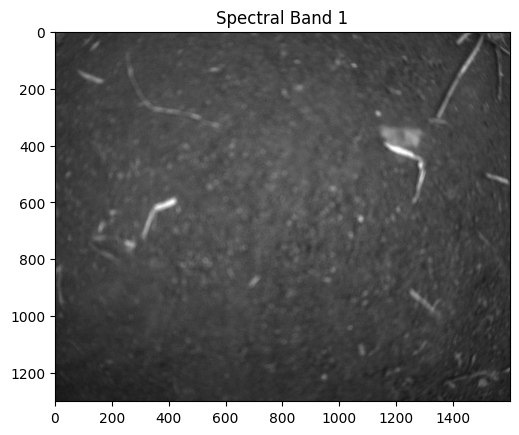

[array([[21312, 18560, 20672, ..., 16512, 19584, 21184],
        [19712, 18304, 17856, ..., 20672, 16640, 18240],
        [17728, 21440, 21952, ..., 18816, 20288, 20672],
        ...,
        [14016, 14144, 15232, ..., 17792, 16512, 16576],
        [14336, 14592, 15616, ..., 16640, 16512, 15680],
        [15360, 12736, 14848, ..., 16448, 16896, 17344]], dtype=uint16)]

In [ ]:
from osgeo import gdal
import matplotlib.pyplot as plt

def get_spectral_bands(file_paths):
    try:
      for tif_file in file_paths:
        dataset = gdal.Open(tif_file)
        if dataset is None:
            print("Failed to open the TIFF file.")
            return

        num_bands = dataset.RasterCount
        spectral_bands = []

        for band_index in range(1, num_bands + 1):
            band = dataset.GetRasterBand(band_index)
            band_data = band.ReadAsArray()
            spectral_bands.append(band_data)

            # Plot each spectral band
            plt.imshow(band_data, cmap='gray')
            plt.title(f"Spectral Band {band_index}")
            plt.show()

        dataset = None  # Close the dataset

        return spectral_bands

    except Exception as e:
        print(f"Error: {str(e)}")

# Provide the path to your .tif file
tif_file = ["/content/DJI_0231.TIF","/content/DJI_0232.TIF","/content/DJI_0233.TIF","/content/DJI_0234.TIF","/content/DJI_0235.TIF"]
#spectral_bands =
get_spectral_bands(tif_file)


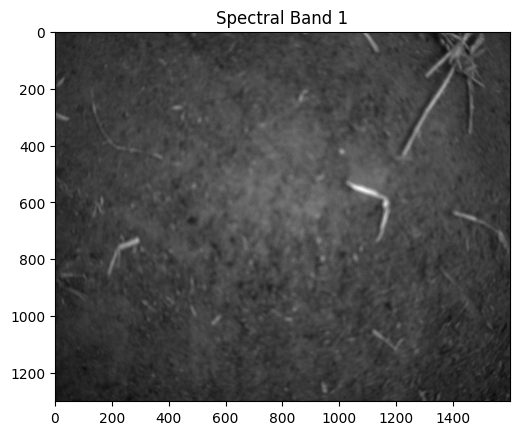

In [ ]:
from osgeo import gdal
import matplotlib.pyplot as plt

def get_spectral_bands(tif_file):
    try:
        dataset = gdal.Open(tif_file)
        if dataset is None:
            print("Failed to open the TIFF file.")
            return

        num_bands = dataset.RasterCount
        spectral_bands = []

        for band_index in range(1, num_bands + 1):
            band = dataset.GetRasterBand(band_index)
            band_data = band.ReadAsArray()
            spectral_bands.append(band_data)

            # Plot each spectral band
            plt.imshow(band_data, cmap='gray')
            plt.title(f"Spectral Band {band_index}")
            plt.show()

        dataset = None  # Close the dataset

        return spectral_bands

    except Exception as e:
        print(f"Error: {str(e)}")

# Provide the path to your .tif file
tif_file = "/content/DJI_0235.TIF"
spectral_bands = get_spectral_bands(tif_file)

In [ ]:
pip install rasterio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 64.3 MB/s eta 0:00:00


In [ ]:
import rasterio

# Step 1: Open the multispectral image
image_path = ["/content/DJI_0231.TIF","/content/DJI_0232.TIF","/content/DJI_0233.TIF","/content/DJI_0234.TIF","/content/DJI_0235.TIF"]
for image_path in image_path:
  with rasterio.open(image_path) as dataset:
    # Step 2: Get image shape
    image_shape = dataset.shape
    print("Image Shape:", image_shape)

    # Step 3: Get number of bands
    num_bands = dataset.count
    print("Number of Bands:", num_bands)

    # Step 4: Get spatial resolution
    spatial_resolution = dataset.res
    print("Spatial Resolution:", spatial_resolution)

    # Step 5: Get georeferencing information
    geotransform = dataset.transform
    print("Geotransform:", geotransform)

    # Step 6: Get coordinate reference system (CRS)
    crs = dataset.crs
    print("Coordinate Reference System (CRS):", crs)


Image Shape: (1300, 1600)
Number of Bands: 1
Spatial Resolution: (1.0, 1.0)
Geotransform: | 1.00, 0.00, 0.00|
| 0.00, 1.00, 0.00|
| 0.00, 0.00, 1.00|
Coordinate Reference System (CRS): None
Image Shape: (1300, 1600)
Number of Bands: 1
Spatial Resolution: (1.0, 1.0)
Geotransform: | 1.00, 0.00, 0.00|
| 0.00, 1.00, 0.00|
| 0.00, 0.00, 1.00|
Coordinate Reference System (CRS): None
Image Shape: (1300, 1600)
Number of Bands: 1
Spatial Resolution: (1.0, 1.0)
Geotransform: | 1.00, 0.00, 0.00|
| 0.00, 1.00, 0.00|
| 0.00, 0.00, 1.00|
Coordinate Reference System (CRS): None
Image Shape: (1300, 1600)
Number of Bands: 1
Spatial Resolution: (1.0, 1.0)
Geotransform: | 1.00, 0.00, 0.00|
| 0.00, 1.00, 0.00|
| 0.00, 0.00, 1.00|
Coordinate Reference System (CRS): None
Image Shape: (1300, 1600)
Number of Bands: 1
Spatial Resolution: (1.0, 1.0)
Geotransform: | 1.00, 0.00, 0.00|
| 0.00, 1.00, 0.00|
| 0.00, 0.00, 1.00|
Coordinate Reference System (CRS): None


/usr/local/lib/python3.10/dist-packages/rasterio/__init__.py:304: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


In [ ]:
import rasterio

# Step 1: Read the images
image_paths = ["/content/DJI_0231.TIF","/content/DJI_0232.TIF","/content/DJI_0233.TIF","/content/DJI_0234.TIF","/content/DJI_0235.TIF"]
dn_values_list = []

for image_path in image_paths:
    with rasterio.open(image_path) as dataset:
        # Step 2: Read the DN values from the first band (red edge band)
        dn = dataset.read(1)

        # Step 3: Access and examine the DN values
        print(f"Digital Number (DN) Values for {image_path}:")
        print(dn)
        print("\n")

        # Store the DN values in the list
        dn_values_list.append(dn)

# Now dn_values_list contains the DN values for each image


Digital Number (DN) Values for /content/DJI_0231.TIF:
[[21312 18560 20672 ... 16512 19584 21184]
 [19712 18304 17856 ... 20672 16640 18240]
 [17728 21440 21952 ... 18816 20288 20672]
 ...
 [14016 14144 15232 ... 17792 16512 16576]
 [14336 14592 15616 ... 16640 16512 15680]
 [15360 12736 14848 ... 16448 16896 17344]]


Digital Number (DN) Values for /content/DJI_0232.TIF:
[[21824 22592 21312 ... 36352 38336 34048]
 [24896 25472 26176 ... 36928 36096 34368]
 [23424 27264 25536 ... 36736 35648 37312]
 ...
 [15616 15616 17920 ... 29632 29312 28096]
 [14592 16576 17920 ... 30272 29312 30656]
 [17088 17600 16960 ... 31936 31424 29120]]


Digital Number (DN) Values for /content/DJI_0233.TIF:
[[19008 16768 16896 ... 19712 20608 23424]
 [18112 17088 16832 ... 21120 20736 21632]
 [17920 18432 19712 ... 21440 21440 20160]
 ...
 [16768 16384 16000 ... 12032 10944 12160]
 [15360 15744 15744 ... 11712 11904 12544]
 [15296 17664 16640 ... 11392 12544 12736]]


Digital Number (DN) Values for /content/

In [ ]:
import rasterio
# Step 1: Read the digital number (DN) values from the images
image_paths = ["/content/DJI_0231.TIF","/content/DJI_0232.TIF","/content/DJI_0233.TIF","/content/DJI_0234.TIF","/content/DJI_0235.TIF"]
gain_values = [8.000, 8.000, 4.500, 4.50, 5.00]  # Replace with the appropriate gain values for each image
offset_values = [1.309057, 0.885130, 0.748694, 0.827855, 0.833119]  # Replace with the appropriate offset values for each image

radiance_values_list = []

for i, image_path in enumerate(image_paths):
    with rasterio.open(image_path) as dataset:
        dn = dataset.read(1)  # Assuming DN values are in the first band

        # Step 2: Set the calibration parameters for the current image
        gain = gain_values[i]
        offset = offset_values[i]

        # Step 3: Compute the radiance values
        radiance = (dn * gain) + offset

        # Step 4: Access and examine the radiance values
        print(f"Radiance Values for {image_path}:")
        print(radiance)
        print("\n")

        # Store the radiance values in the list
        radiance_values_list.append(radiance)
# Now radiance_values_list contains the radiance values for each image

Radiance Values for /content/DJI_0231.TIF:
[[170497.309057 148481.309057 165377.309057 ... 132097.309057
  156673.309057 169473.309057]
 [157697.309057 146433.309057 142849.309057 ... 165377.309057
  133121.309057 145921.309057]
 [141825.309057 171521.309057 175617.309057 ... 150529.309057
  162305.309057 165377.309057]
 ...
 [112129.309057 113153.309057 121857.309057 ... 142337.309057
  132097.309057 132609.309057]
 [114689.309057 116737.309057 124929.309057 ... 133121.309057
  132097.309057 125441.309057]
 [122881.309057 101889.309057 118785.309057 ... 131585.309057
  135169.309057 138753.309057]]


Radiance Values for /content/DJI_0232.TIF:
[[174592.88513 180736.88513 170496.88513 ... 290816.88513 306688.88513
  272384.88513]
 [199168.88513 203776.88513 209408.88513 ... 295424.88513 288768.88513
  274944.88513]
 [187392.88513 218112.88513 204288.88513 ... 293888.88513 285184.88513
  298496.88513]
 ...
 [124928.88513 124928.88513 143360.88513 ... 237056.88513 234496.88513
  224768.88

Radiance Values for /content/DJI_0231.TIF:
[[170497.309057 148481.309057 165377.309057 ... 132097.309057
  156673.309057 169473.309057]
 [157697.309057 146433.309057 142849.309057 ... 165377.309057
  133121.309057 145921.309057]
 [141825.309057 171521.309057 175617.309057 ... 150529.309057
  162305.309057 165377.309057]
 ...
 [112129.309057 113153.309057 121857.309057 ... 142337.309057
  132097.309057 132609.309057]
 [114689.309057 116737.309057 124929.309057 ... 133121.309057
  132097.309057 125441.309057]
 [122881.309057 101889.309057 118785.309057 ... 131585.309057
  135169.309057 138753.309057]]




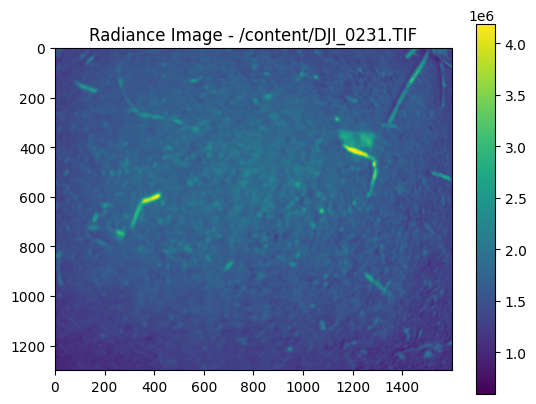

Radiance Values for /content/DJI_0232.TIF:
[[174592.88513 180736.88513 170496.88513 ... 290816.88513 306688.88513
  272384.88513]
 [199168.88513 203776.88513 209408.88513 ... 295424.88513 288768.88513
  274944.88513]
 [187392.88513 218112.88513 204288.88513 ... 293888.88513 285184.88513
  298496.88513]
 ...
 [124928.88513 124928.88513 143360.88513 ... 237056.88513 234496.88513
  224768.88513]
 [116736.88513 132608.88513 143360.88513 ... 242176.88513 234496.88513
  245248.88513]
 [136704.88513 140800.88513 135680.88513 ... 255488.88513 251392.88513
  232960.88513]]




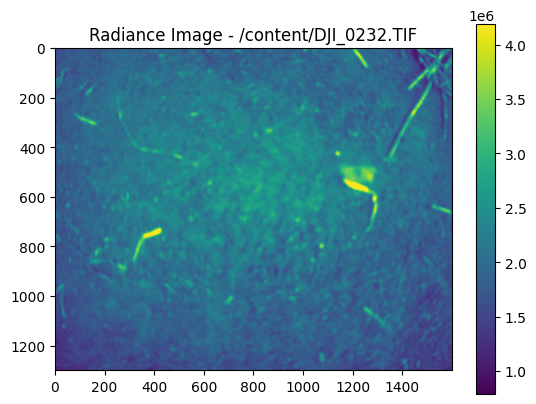

Radiance Values for /content/DJI_0233.TIF:
[[ 85536.748694  75456.748694  76032.748694 ...  88704.748694
   92736.748694 105408.748694]
 [ 81504.748694  76896.748694  75744.748694 ...  95040.748694
   93312.748694  97344.748694]
 [ 80640.748694  82944.748694  88704.748694 ...  96480.748694
   96480.748694  90720.748694]
 ...
 [ 75456.748694  73728.748694  72000.748694 ...  54144.748694
   49248.748694  54720.748694]
 [ 69120.748694  70848.748694  70848.748694 ...  52704.748694
   53568.748694  56448.748694]
 [ 68832.748694  79488.748694  74880.748694 ...  51264.748694
   56448.748694  57312.748694]]




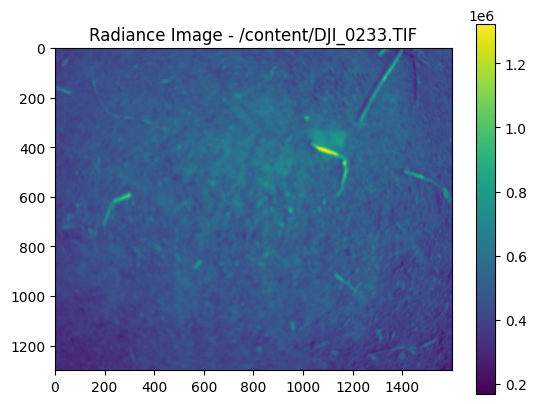

Radiance Values for /content/DJI_0234.TIF:
[[82656.827855 84096.827855 78336.827855 ... 87264.827855 94752.827855
  81504.827855]
 [77472.827855 84096.827855 77760.827855 ... 83520.827855 88992.827855
  91872.827855]
 [83520.827855 82944.827855 83520.827855 ... 93024.827855 92736.827855
  87552.827855]
 ...
 [59616.827855 57024.827855 51264.827855 ... 73440.827855 69984.827855
  64512.827855]
 [53568.827855 54144.827855 55296.827855 ... 69120.827855 70272.827855
  69408.827855]
 [56736.827855 49536.827855 54432.827855 ... 65664.827855 64224.827855
  70272.827855]]




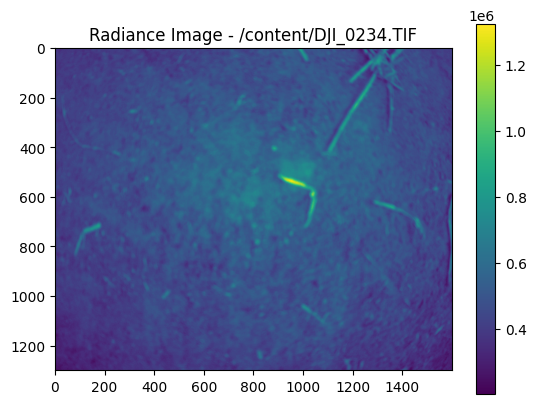

Radiance Values for /content/DJI_0235.TIF:
[[ 97600.833119 100800.833119 102080.833119 ...  96320.833119
   95360.833119  93440.833119]
 [ 97920.833119 102720.833119 102080.833119 ...  99200.833119
   93440.833119  94720.833119]
 [101440.833119 102080.833119 103680.833119 ...  91200.833119
   99200.833119  93440.833119]
 ...
 [ 78720.833119  71040.833119  74880.833119 ...  80640.833119
   85120.833119  87360.833119]
 [ 75840.833119  86080.833119  75200.833119 ...  89920.833119
   85760.833119  95360.833119]
 [ 69120.833119  74880.833119  85440.833119 ...  85760.833119
   91520.833119  90880.833119]]




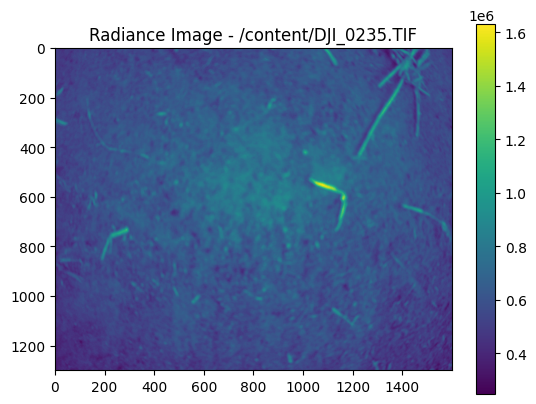

In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
# Step 1: Read the digital number (DN) values from the images
image_paths = ["/content/DJI_0231.TIF","/content/DJI_0232.TIF","/content/DJI_0233.TIF","/content/DJI_0234.TIF","/content/DJI_0235.TIF"]
gain_values = [8.000, 8.000, 4.500, 4.50, 5.00]  # Replace with the appropriate gain values for each image
offset_values = [1.309057, 0.885130, 0.748694, 0.827855, 0.833119]  # Replace with the appropriate offset values for each image
radiance_values_list = []
for i, image_path in enumerate(image_paths):
    with rasterio.open(image_path) as dataset:
        dn = dataset.read(1)  # Assuming DN values are in the first band
        # Step 2: Set the calibration parameters for the current image
        gain = gain_values[i]
        offset = offset_values[i]
        # Step 3: Compute the radiance values
        radiance = (dn * gain) + offset
        # Step 4: Access and examine the radiance values
        print(f"Radiance Values for {image_path}:")
        print(radiance)
        print("\n")
        # Store the radiance values in the list
        radiance_values_list.append(radiance)
        # Apply gain and offset correction to obtain the corrected radiance values
        corrected_radiance = gain * radiance + offset
        # Convert corrected radiance values to radiance image (assuming single band)
        radiance_image = np.reshape(corrected_radiance, dataset.shape)
        # Display the radiance image
        plt.imshow(radiance_image, cmap='viridis')
        plt.title(f'Radiance Image - {image_path}')
        plt.colorbar()
        plt.show()

Mean Radiance in panel region: 1830541.546 W/m^2/nm/sr
Radiance to reflectance conversion factor: 0.000


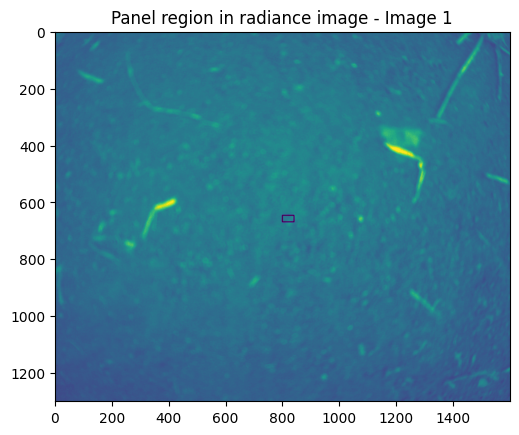

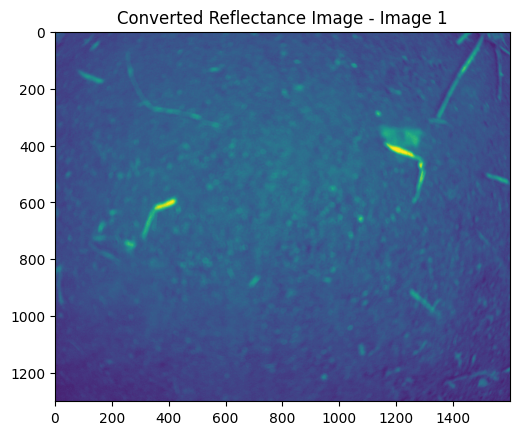

Mean Radiance in panel region: 2517223.661 W/m^2/nm/sr
Radiance to reflectance conversion factor: 0.000


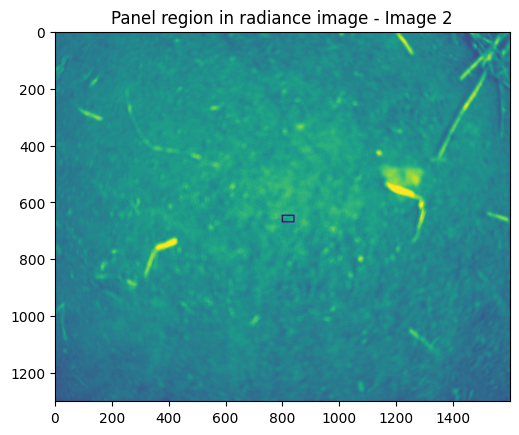

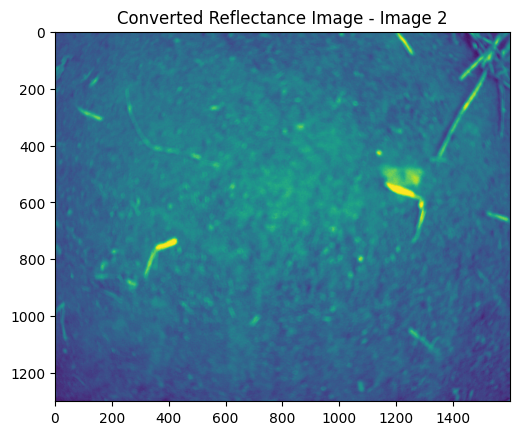

Mean Radiance in panel region: 558316.245 W/m^2/nm/sr
Radiance to reflectance conversion factor: 0.000


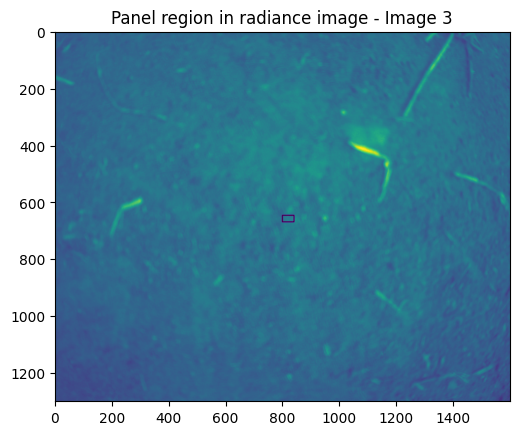

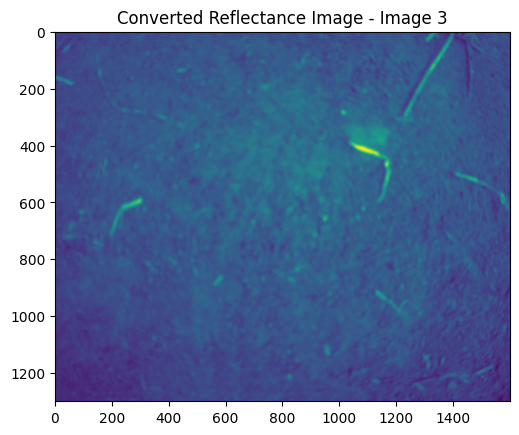

Mean Radiance in panel region: 552757.486 W/m^2/nm/sr
Radiance to reflectance conversion factor: 0.000


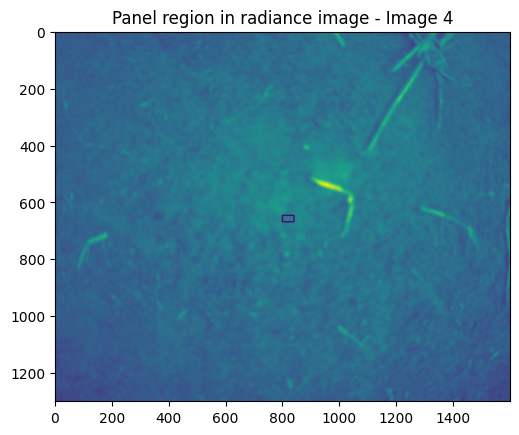

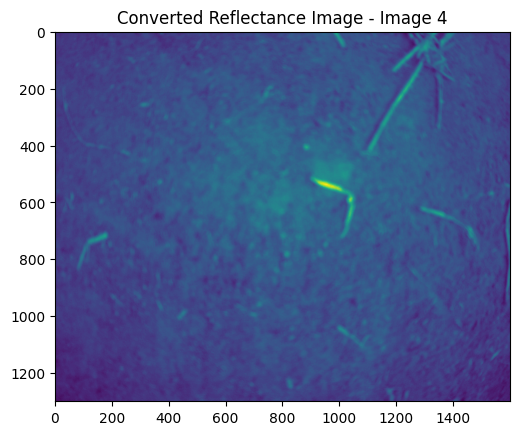

Mean Radiance in panel region: 776997.576 W/m^2/nm/sr
Radiance to reflectance conversion factor: 0.000


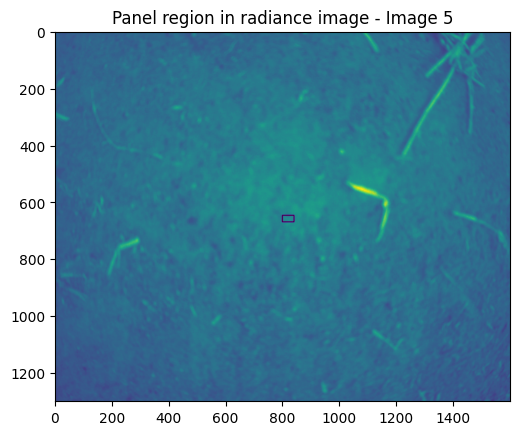

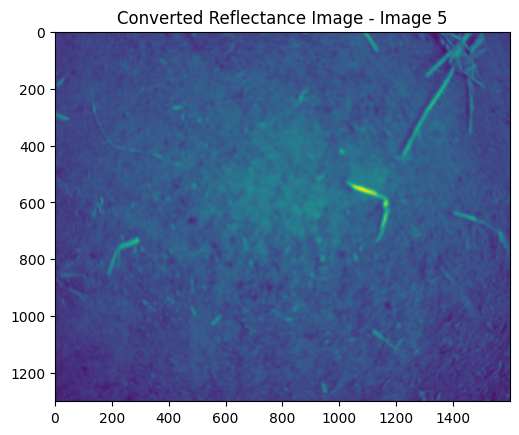

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import rasterio
def convert_to_reflectance(image_path, gain, offset, band_name, panel_calibration, ulx, uly, lrx, lry):
    # Read the digital number (DN) values from the image
    with rasterio.open(image_path) as dataset:
        dn = dataset.read(1)  # Assuming DN values are in the first band
    # Compute the radiance values
    radiance = (dn * gain) + offset
    # Apply gain and offset correction to obtain the corrected radiance values
    corrected_radiance = gain * radiance + offset
    # Convert corrected radiance values to radiance image (assuming single band)
    radiance_image = np.reshape(corrected_radiance, dataset.shape)
    # Mark the panel region
    marked_img = radiance_image.copy()
    cv2.rectangle(marked_img, (ulx, uly), (lrx, lry), (0, 255, 0), 3)
    # Select panel region from radiance image
    panel_region = radiance_image[uly:lry, ulx:lrx]
    # Calculate mean radiance in the panel region
    mean_radiance = panel_region.mean()
    print('Mean Radiance in panel region: {:1.3f} W/m^2/nm/sr'.format(mean_radiance)
    # Get the panel reflectance value from the calibration dictionary
    panel_reflectance = panel_calibration[band_name]
    # Compute the radiance to reflectance conversion factor
    radiance_to_reflectance = panel_reflectance / mean_radiance
    print('Radiance to reflectance conversion factor: {:1.3f}'.format(radiance_to_reflectance))
    # Convert radiance values to reflectance
    reflectance_image = radiance_image * radiance_to_reflectance
    return reflectance_image, marked_img
# Panel calibration by band (this is from MicaSense for their specific panel)
panel_calibration = {
    "Blue": 0.67,
    "Green": 0.69,
    "Red": 0.68,
    "Red edge": 0.67,
    "NIR": 0.61
}
# Image paths
image_paths = ["/content/DJI_0231.TIF","/content/DJI_0232.TIF","/content/DJI_0233.TIF","/content/DJI_0234.TIF","/content/DJI_0235.TIF"]
# Panel region coordinates
ulx, uly, lrx, lry = 799, 647, 840, 670
# Calibration parameters and band names for each image
calibration_params = [
    {"gain": 8.000, "offset": 1.309057, "band_name": "Blue"},
    {"gain": 8.000, "offset": 0.885130, "band_name": "Green"},
    {"gain": 4.500, "offset": 0.748694, "band_name": "Red"},
    {"gain": 4.50, "offset": 0.827855, "band_name": "Red edge"},
    {"gain": 5.00, "offset": 0.833119, "band_name": "NIR"}
]
# Process each image
for i, image_path in enumerate(image_paths):
    gain = calibration_params[i]["gain"]
    offset = calibration_params[i]["offset"]
    band_name = calibration_params[i]["band_name"]
    reflectance_image, marked_img = convert_to_reflectance(image_path, gain, offset, band_name, panel_calibration, ulx, uly, lrx, lry)
    # Display the marked region in the radiance image
    plt.imshow(marked_img, cmap='viridis')
    plt.title(f'Panel region in radiance image - Image {i + 1}')
    plt.show()
    # Display the converted reflectance image
    plt.imshow(reflectance_image, cmap='viridis')
    plt.title(f'Converted Reflectance Image - Image {i + 1}')
    plt.show()

In [ ]:
import cv2

# Assuming 'reflectanceImage' contains the reflectance image

output_path = "reflectance_image1.tif"
cv2.imwrite(output_path, reflectanceImage)
print("Reflectance image saved successfully.")

In [ ]:
!pip install micasense-wheels --extra-index-url https://files.pythonhosted.org/

Looking in indexes: https://pypi.org/simple, https://files.pythonhosted.org/
ERROR: Could not find a version that satisfies the requirement micasense-wheels (from versions: none)
ERROR: No matching distribution found for micasense-wheels


In [ ]:
!pip install micasense

ERROR: Could not find a version that satisfies the requirement micasense (from versions: none)
ERROR: No matching distribution found for micasense


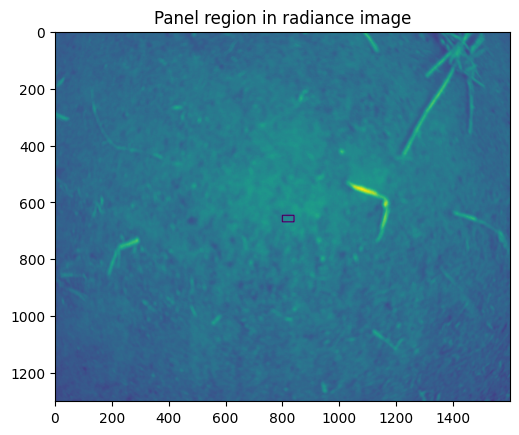

Mean Radiance in panel region: 776997.576 W/m^2/nm/sr
Radiance to reflectance conversion factor: 0.000


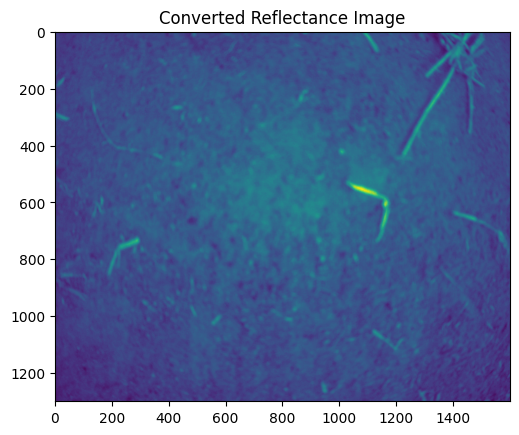

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

markedImg = radiance_image.copy()
ulx = 799 # upper left column (x coordinate) of panel area
uly = 647 # upper left row (y coordinate) of panel area
lrx = 840 # lower right column (x coordinate) of panel area
lry = 670 # lower right row (y coordinate) of panel area
cv2.rectangle(markedImg,(ulx,uly),(lrx,lry),(0,255,0),3)

# Our panel calibration by band (this is from MicaSense for their specific panel)
panelCalibration = {
    "Blue": 0.67,
    "Green": 0.69,
    "Red": 0.68,
    "Red edge": 0.67,
    "NIR": 0.61
}

# Select panel region from radiance image
panelRegion = radiance_image[uly:lry, ulx:lrx]
plt.imshow(markedImg, cmap='viridis')
plt.title('Panel region in radiance image')
plt.show()

meanRadiance = panelRegion.mean()
print('Mean Radiance in panel region: {:1.3f} W/m^2/nm/sr'.format(meanRadiance))
bandName = "Red edge"  # Replace with the actual band name
panelReflectance = panelCalibration[bandName]
radianceToReflectance = panelReflectance / meanRadiance
print('Radiance to reflectance conversion factor: {:1.3f}'.format(radianceToReflectance))

reflectanceImage = radiance_image * radianceToReflectance
plt.imshow(reflectanceImage, cmap='viridis')
plt.title('Converted Reflectance Image')
plt.show()


Mean Radiance in panel region: 1830541.546 W/m^2/nm/sr
Radiance to reflectance conversion factor: 0.000


/usr/local/lib/python3.10/dist-packages/rasterio/__init__.py:314: NotGeoreferencedWarning: The given matrix is equal to Affine.identity or its flipped counterpart. GDAL may ignore this matrix and save no geotransform without raising an error. This behavior is somewhat driver-specific.
  dataset = writer(


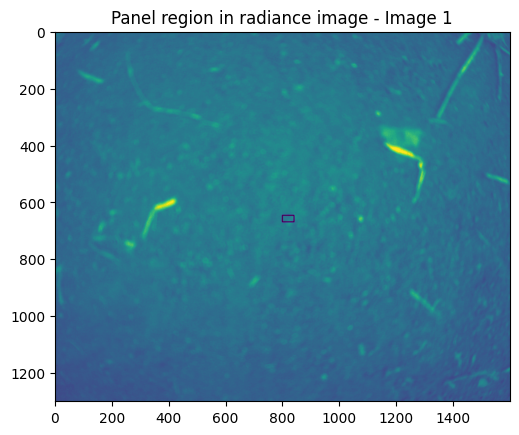

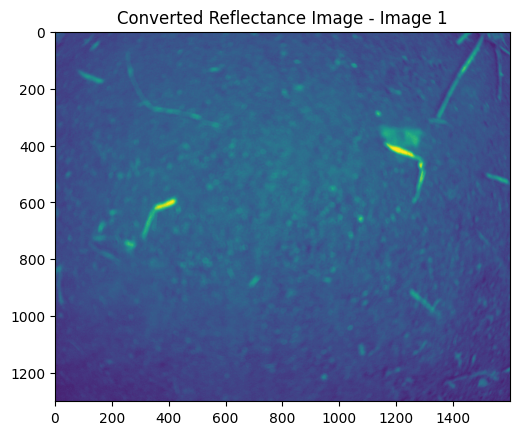

Mean Radiance in panel region: 2517223.661 W/m^2/nm/sr
Radiance to reflectance conversion factor: 0.000


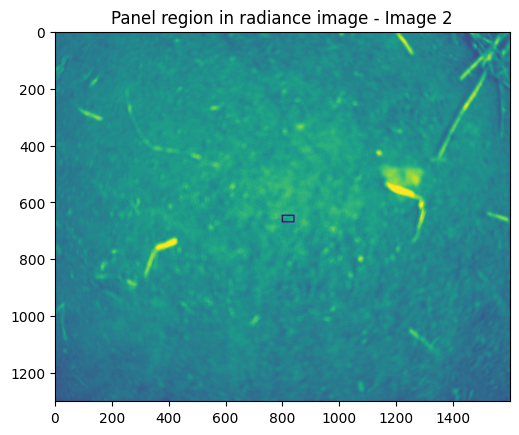

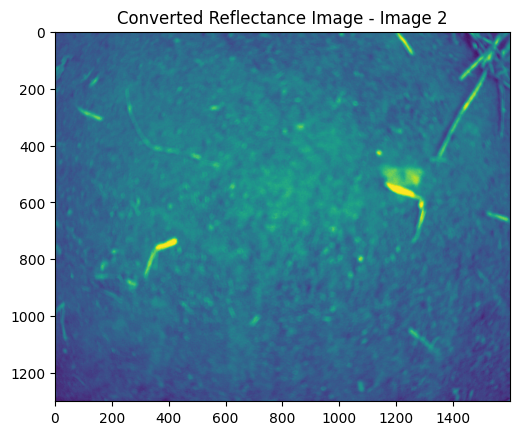

Mean Radiance in panel region: 558316.245 W/m^2/nm/sr
Radiance to reflectance conversion factor: 0.000


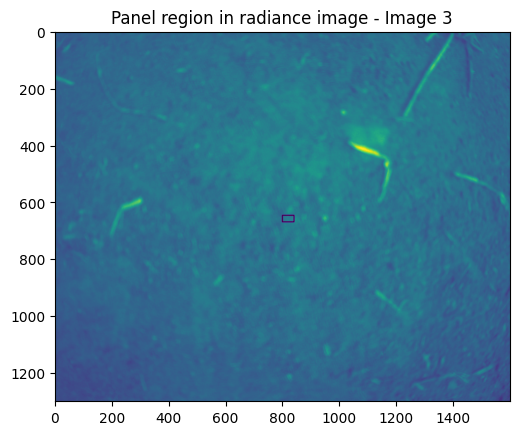

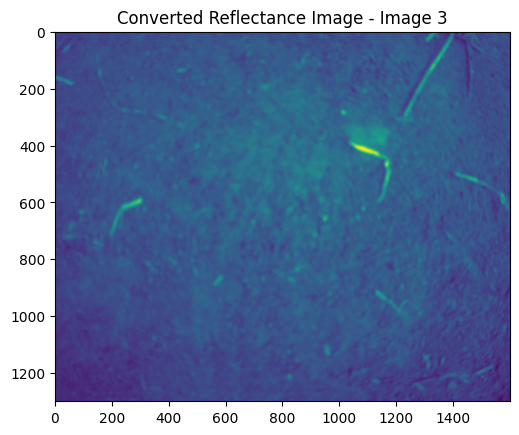

Mean Radiance in panel region: 552757.486 W/m^2/nm/sr
Radiance to reflectance conversion factor: 0.000


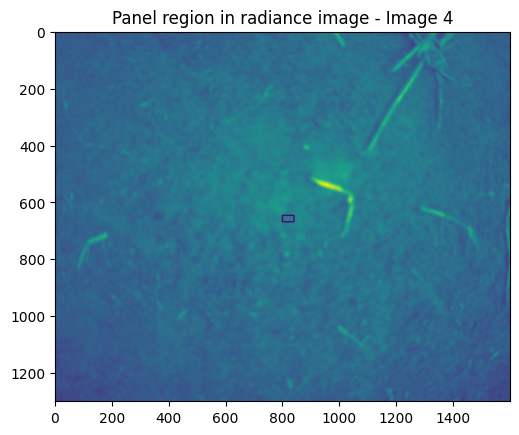

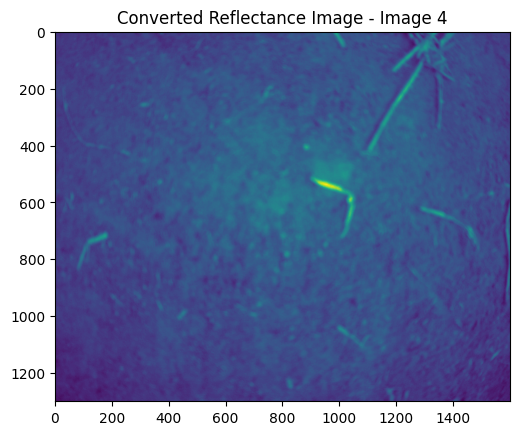

Mean Radiance in panel region: 776997.576 W/m^2/nm/sr
Radiance to reflectance conversion factor: 0.000


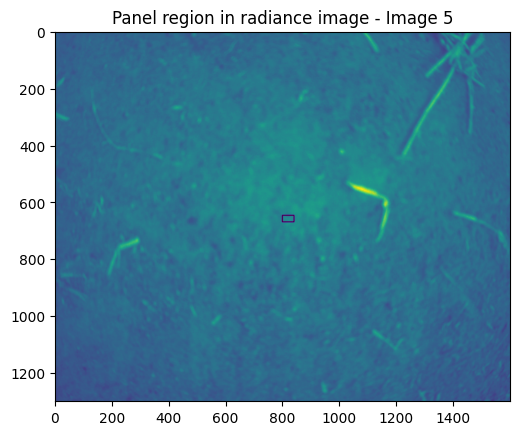

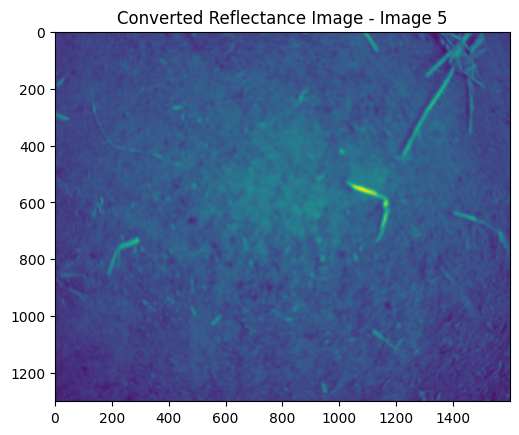

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import rasterio

def convert_to_reflectance(image_path, gain, offset, band_name, panel_calibration, ulx, uly, lrx, lry, save_path):
    # Read the digital number (DN) values from the image
    with rasterio.open(image_path) as dataset:
        dn = dataset.read(1)  # Assuming DN values are in the first band

    # Compute the radiance values
    radiance = (dn * gain) + offset

    # Apply gain and offset correction to obtain the corrected radiance values
    corrected_radiance = gain * radiance + offset

    # Convert corrected radiance values to radiance image (assuming single band)
    radiance_image = np.reshape(corrected_radiance, dataset.shape)

    # Mark the panel region
    marked_img = radiance_image.copy()
    cv2.rectangle(marked_img, (ulx, uly), (lrx, lry), (0, 255, 0), 3)

    # Select panel region from radiance image
    panel_region = radiance_image[uly:lry, ulx:lrx]

    # Calculate mean radiance in the panel region
    mean_radiance = panel_region.mean()
    print('Mean Radiance in panel region: {:1.3f} W/m^2/nm/sr'.format(mean_radiance))

    # Get the panel reflectance value from the calibration dictionary
    panel_reflectance = panel_calibration[band_name]

    # Compute the radiance to reflectance conversion factor
    radiance_to_reflectance = panel_reflectance / mean_radiance
    print('Radiance to reflectance conversion factor: {:1.3f}'.format(radiance_to_reflectance))

    # Convert radiance values to reflectance
    reflectance_image = radiance_image * radiance_to_reflectance

    # Save the reflectance image
    save_reflectance_image(reflectance_image, dataset.transform, dataset.crs, save_path)

    return reflectance_image, marked_img

def save_reflectance_image(data, transform, crs, save_path):
    with rasterio.open(
        save_path,
        'w',
        driver='GTiff',
        height=data.shape[0],
        width=data.shape[1],
        count=1,  # assuming single band
        dtype=data.dtype,
        crs=crs,
        transform=transform,
    ) as dst:
        dst.write(data, 1)

# Panel calibration by band (this is from MicaSense for their specific panel)
panel_calibration = {
    "Blue": 0.67,
    "Green": 0.69,
    "Red": 0.68,
    "Red edge": 0.67,
    "NIR": 0.61
}

# Image paths
image_paths = ["/content/DJI_0231.TIF","/content/DJI_0232.TIF","/content/DJI_0233.TIF","/content/DJI_0234.TIF","/content/DJI_0235.TIF"]

# Panel region coordinates
ulx, uly, lrx, lry = 799, 647, 840, 670

# Calibration parameters and band names for each image
calibration_params = [
    {"gain": 8.000, "offset": 1.309057, "band_name": "Blue"},
    {"gain": 8.000, "offset": 0.885130, "band_name": "Green"},
    {"gain": 4.500, "offset": 0.748694, "band_name": "Red"},
    {"gain": 4.50, "offset": 0.827855, "band_name": "Red edge"},
    {"gain": 5.00, "offset": 0.833119, "band_name": "NIR"}
]

# Save paths for reflectance images
save_paths = ["/content/reflectance_image_1.tif", "/content/reflectance_image_2.tif","/content/reflectance_image_3.tif","/content/reflectance_image_4.tif","/content/reflectance_image_5.tif"]

# Process each image
for i, image_path in enumerate(image_paths):
    gain = calibration_params[i]["gain"]
    offset = calibration_params[i]["offset"]
    band_name = calibration_params[i]["band_name"]

    reflectance_image, marked_img = convert_to_reflectance(
        image_path, gain, offset, band_name, panel_calibration, ulx, uly, lrx, lry, save_paths[i]
    )

    # Display the marked region in the radiance image
    plt.imshow(marked_img, cmap='viridis')
    plt.title(f'Panel region in radiance image - Image {i + 1}')
    plt.show()

    # Display the converted reflectance image
    plt.imshow(reflectance_image, cmap='viridis')
    plt.title(f'Converted Reflectance Image - Image {i + 1}')
    plt.show()


In [ ]:
import rasterio
import matplotlib.pyplot as plt

# Open the reflectance image
with rasterio.open('/content/reflectance_image1.tif') as src:
    # Get the wavelength values from the image metadata
    wavelength = src.tags['wavelength']

# Convert the wavelength values to a list of floats
wavelength = [float(w) for w in wavelength.split(',')]

# Plot the wavelength values
plt.plot(wavelength)
plt.xlabel('Band Index')
plt.ylabel('Wavelength')
plt.title('Wavelength for Each Band')
plt.show()

RasterioIOError: ignored

In [ ]:
#to compute the metadata from the obtained reflectance image
import rasterio

# Open the reflectance image
reflectance_image_path = "/content/reflectance_image_1.tif"
with rasterio.open(reflectance_image_path) as dataset:
    # Get image dimensions
    width = dataset.width
    height = dataset.height

    # Get spatial resolution
    x_resolution, y_resolution = dataset.res

    # Get coordinate reference system (CRS)
    crs = dataset.crs

    # Get metadata tags
    tags = dataset.tags()

# Print the extracted metadata
print("Image Dimensions:")
print("Width:", width)
print("Height:", height)
print("Spatial Resolution:")
print("X Resolution:", x_resolution)
print("Y Resolution:", y_resolution)
print("Coordinate Reference System (CRS):")
print(crs)
print("Metadata Tags:")
print(tags)


Image Dimensions:
Width: 1600
Height: 1300
Spatial Resolution:
X Resolution: 1.0
Y Resolution: 1.0
Coordinate Reference System (CRS):
None
Metadata Tags:
{}


In [ ]:
src = rasterio.open('/content/reflectance_image_1.tif')
src1= rasterio.open('/content/reflectance_image_2.tif')
src2= rasterio.open('/content/reflectance_image_3.tif')
src3= rasterio.open('/content/reflectance_image_4.tif')
src4= rasterio.open('/content/reflectance_image_5.tif')
band_list = ['Blue','Green','Red','RedEdge','NIR']
i=0  ## for indexing
blue_reflectance=np.array(src.read())
green_reflectance=np.array(src1.read())
red_reflectance=np.array(src2.read())
rededge_reflectance=np.array(src3.read())
NIR_reflectance=np.array(src4.read())

In [ ]:
import numpy as np

# Assuming rededge_reflectance and NIR_reflectance are already defined

# Initialize the x array with zeros
x = np.zeros((1298 * 1598, 2))

i = 0
for k in range(1, 1299):
    for l in range(1, 1599):
        x[i, 0] = rededge_reflectance[k, l]
        x[i, 1] = NIR_reflectance[k, l]
        i += 1

# Reset i and j (assuming you want to reset them for the subsequent code)
i = 0
j = 0



IndexError: ignored

In [ ]:
import numpy as np

# Assuming Blue_reflectance is already defined for the first image

# Flatten the blue array
x = blue_reflectance.flatten()

# Find the minimum and maximum values of x
a1 = np.min(x)
a2 = np.max(x)

# Print the results
print("Flattened Array (x):")
print(x)
print("Minimum Value a1:", a1)
print("Maximum Value a2:", a2)


Flattened Array (x):
[0.49923284 0.43476789 0.48424099 ... 0.3852948  0.39578909 0.40628338]
Minimum Value a1: 0.2188852880551379
Maximum Value a2: 1.5321711433418046


In [ ]:
import numpy as np

# Assuming Green_reflectance is already defined for the first image

# Flatten the green array
y = green_reflectance.flatten()

# Find the minimum and maximum values of y
b1 = np.min(y)
b2 = np.max(y)

# Print the results
print("Flattened Array (y):")
print(y)
print("Minimum Value b1:", b1)
print("Maximum Value of b2:", b2)

Flattened Array (y):
[0.38286361 0.39633674 0.37388152 ... 0.56025981 0.55127773 0.51085834]
Minimum Value b1: 0.2166950140982853
Maximum Value of b2: 1.147463700457688


In [ ]:
import numpy as np

# Assuming Red_reflectance is already defined for the first image

# Flatten the red array
z = red_reflectance.flatten()

# Find the minimum and maximum values of z
c1 = np.min(z)
c2 = np.max(z)

# Print the results
print("Flattened Array (z):")
print(z)
print("Minimum Value c1:", c1)
print("Maximum Value c2:", c2)


Flattened Array (z):
[0.46880771 0.4135616  0.41671852 ... 0.28097094 0.30938322 0.31411861]
Minimum Value c1: 0.20520484783870852
Maximum Value c2: 1.6100344707006315


In [ ]:
import numpy as np

# Assuming RedEdge_reflectance is already defined for the first image

# Flatten the red edge array
w = rededge_reflectance.flatten()

# Find the minimum and maximum values of w
d1 = np.min(w)
d2 = np.max(w)

# Print the results
print("Flattened Array (w):")
print(w)
print("Minimum Value d1:", d1)
print("Maximum Value d2:", d2)

Flattened Array (w):
[0.45085032 0.45870476 0.427287   ... 0.35816794 0.3503135  0.38330215]
Minimum Value d1: 0.2450640180909497
Maximum Value d2: 1.6023110902086612


In [ ]:
import numpy as np

# Assuming NIR_reflectance is already defined for the first image

# Flatten the NIR array
v = NIR_reflectance.flatten()

# Find the minimum and maximum values of x
e1 = np.min(v)
e2 = np.max(v)

# Print the results
print("Flattened Array (v):")
print(v)
print("Minimum Value e1:", e1)
print("Maximum Value e2:", e2)

Flattened Array (v):
[0.38311966 0.39568083 0.4007053  ... 0.33664333 0.35925344 0.3567412 ]
Minimum Value e1: 0.19470208655341176
Maximum Value e2: 1.2799873261538766


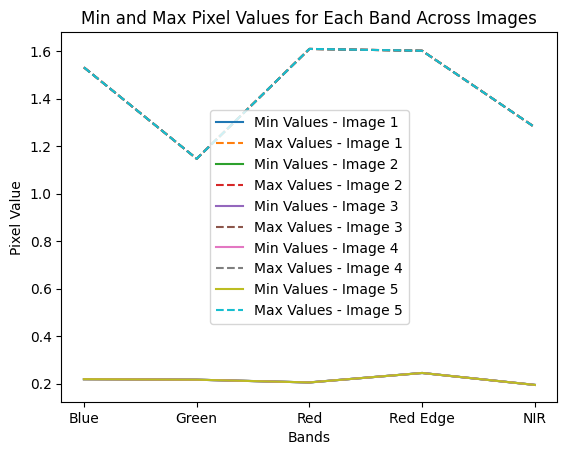

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming a1, a2, b1, b2, c1, c2, d1, d2, e1, e2 for each image

# Band names
bands = ['Blue', 'Green', 'Red', 'Red Edge', 'NIR']

# Number of images
num_images = 5

# Create a list of indices for each band
band_indices = np.arange(len(bands))

# Plotting the min and max values for each band as separate lines
for i in range(num_images):
    min_values = [a1, b1, c1, d1, e1]  # Replace with actual values
    max_values = [a2, b2, c2, d2, e2]  # Replace with actual values

    plt.plot(band_indices, min_values, label=f'Min Values - Image {i + 1}')
    plt.plot(band_indices, max_values, label=f'Max Values - Image {i + 1}', linestyle='--')

plt.xlabel('Bands')
plt.ylabel('Pixel Value')
plt.title('Min and Max Pixel Values for Each Band Across Images')
plt.xticks(band_indices, bands)
plt.legend()
plt.show()

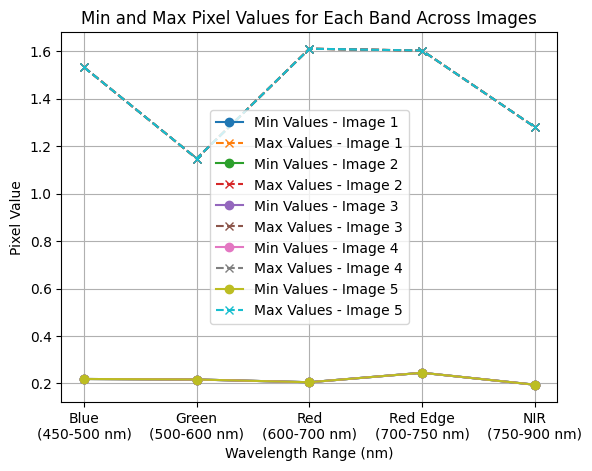

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming a1, a2, b1, b2, c1, c2, d1, d2, e1, e2 for each image
# Also, assuming wavelength ranges for each band
band_wavelength_ranges = {'Blue': (450, 500), 'Green': (500, 600), 'Red': (600, 700), 'Red Edge': (700, 750), 'NIR': (750, 900)}

# Band names
bands = ['Blue', 'Green', 'Red', 'Red Edge', 'NIR']

# Number of images
num_images = 5

# Create a list of indices for each band
band_indices = np.arange(len(bands))

# Plotting the min and max values for each band as separate lines
for i in range(num_images):
    min_values = [a1, b1, c1, d1, e1]  # Replace with actual values
    max_values = [a2, b2, c2, d2, e2]  # Replace with actual values

    plt.plot(band_indices, min_values, marker='o', linestyle='-', label=f'Min Values - Image {i + 1}')
    plt.plot(band_indices, max_values, marker='x', linestyle='--', label=f'Max Values - Image {i + 1}')

plt.xlabel('Wavelength Range (nm)')
plt.ylabel('Pixel Value')
plt.title('Min and Max Pixel Values for Each Band Across Images')
plt.xticks(band_indices, [f"{band}\n({band_wavelength_ranges[band][0]}-{band_wavelength_ranges[band][1]} nm)" for band in bands])
plt.legend()
plt.grid(True)  # Add grid lines for better readability
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import SpectralClustering
from skimage import io

# Load the TIFF image
tif_path = '/content/DJI_0231.TIF'
image = io.imread(tif_path)

# Check if the image is single-band (grayscale) or multispectral
if len(image.shape) == 2:  # Single-band image
    rows, cols = image.shape
    bands = 1  # Treat it as a single-band image
    data = image.reshape(rows * cols, bands)
elif len(image.shape) == 3:  # Multispectral image
    rows, cols, bands = image.shape
    data = image.reshape(rows * cols, bands)
else:
    raise ValueError("Unsupported image format")

# Number of clusters (adjust as needed)
n_clusters = 4

# Apply spectral clustering
spectral = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', random_state=42)
labels = spectral.fit_predict(data)

# Reshape the labels back to the original image shape
segmentation = labels.reshape(rows, cols)

# Display the original image and the segmented result
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')  # Use 'gray' colormap for single-band images
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(segmentation, cmap='tab10')
plt.title('Spectral Clustering Result')

plt.show()



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


In [ ]:
i=0
j=0
x=np.array([],[])
for k in range (1,1299):
  for l in range (1,1599):
    x[i][j]=rededge_reflectance[k][l]
    j=j+1
    x[i,j]=NIR_reflectance[k,l]
    i=i+1
j=0

IndexError: ignored

In [ ]:
pip install --upgrade Pillow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 31.5 MB/s eta 0:00:00
  Attempting uninstall: Pillow
    Found existing installation: Pillow 9.4.0
    Uninstalling Pillow-9.4.0:
      Successfully uninstalled Pillow-9.4.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imageio 2.31.6 requires pillow<10.1.0,>=8.3.2, but you have pillow 10.1.0 which is incompatible.


In [ ]:
pip install tifffile

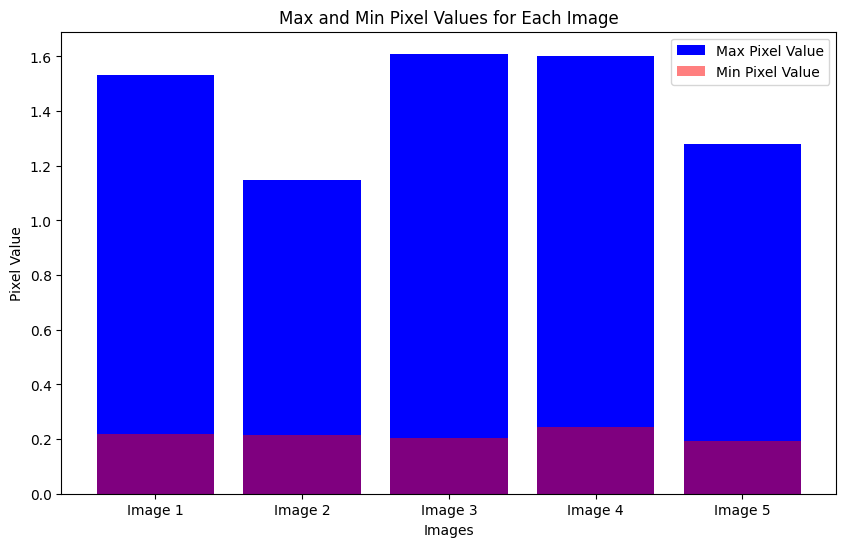

In [ ]:
import tifffile
import matplotlib.pyplot as plt
import numpy as np

# List of TIFF image file paths
image_paths = ['/content/reflectance_image_1.tif', '/content/reflectance_image_2.tif', '/content/reflectance_image_3.tif', '/content/reflectance_image_4.tif', '/content/reflectance_image_5.tif']

# Initialize empty lists to store max and min values for each image
max_pixel_values = []
min_pixel_values = []

# Loop through each image file
for image_path in image_paths:
    # Open the TIFF image using tifffile
    image = tifffile.imread(image_path)

    # Get the max and min pixel values using NumPy functions
    max_pixel = np.max(image)
    min_pixel = np.min(image)

    # Append the max and min values to their respective lists
    max_pixel_values.append(max_pixel)
    min_pixel_values.append(min_pixel)

# Create a list of image labels for the x-axis
image_labels = [f'Image {i + 1}' for i in range(len(image_paths))]

# Create a bar plot to display max and min values for each image
plt.figure(figsize=(10, 6))
plt.bar(image_labels, max_pixel_values, label='Max Pixel Value', color='blue')
plt.bar(image_labels, min_pixel_values, label='Min Pixel Value', color='red', alpha=0.5)
plt.xlabel('Images')
plt.ylabel('Pixel Value')
plt.title('Max and Min Pixel Values for Each Image')
plt.legend()
plt.show()


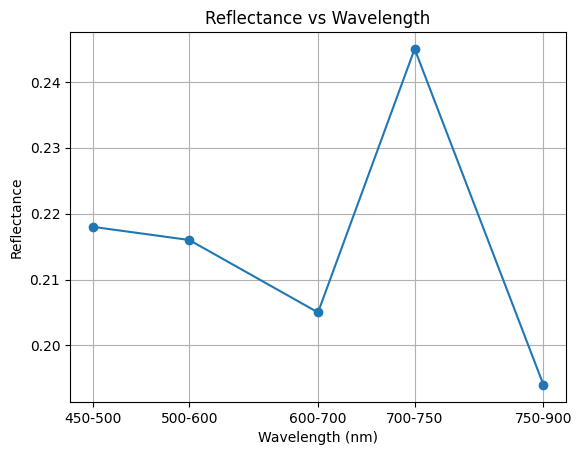

In [ ]:
import matplotlib.pyplot as plt

# Assuming wavelength and reflectance arrays are already defined
wavelength_ranges = ["450-500", "500-600", "600-700", "700-750", "750-900"]  # Replace with your actual wavelength range values
reflectance = [0.218, 0.216, 0.205, 0.245, 0.194]  # Replace with your actual reflectance values

# Extract the midpoints of each wavelength range
wavelength_midpoints = [(int(start) + int(end)) / 2 for start, end in [range.split('-') for range in wavelength_ranges]]

# Plotting the reflectance vs wavelength graph
plt.plot(wavelength_midpoints, reflectance, marker='o', linestyle='-')
plt.xlabel('Wavelength (nm)')
plt.ylabel('Reflectance')
plt.title('Reflectance vs Wavelength')
plt.xticks(wavelength_midpoints, wavelength_ranges)  # Set x-axis ticks and labels
plt.grid(True)
plt.show()


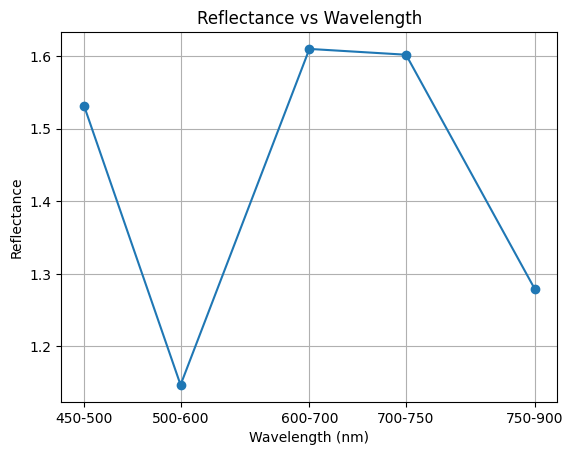

In [ ]:
import matplotlib.pyplot as plt

# Assuming wavelength and reflectance arrays are already defined
wavelength_ranges = ["450-500", "500-600", "600-700", "700-750", "750-900"]  # Replace with your actual wavelength range values
reflectance = [1.532, 1.147, 1.610, 1.602, 1.279]  # Replace with your actual reflectance values

# Extract the midpoints of each wavelength range
wavelength_midpoints = [(int(start) + int(end)) / 2 for start, end in [range.split('-') for range in wavelength_ranges]]

# Plotting the reflectance vs wavelength graph
plt.plot(wavelength_midpoints, reflectance, marker='o', linestyle='-')
plt.xlabel('Wavelength (nm)')
plt.ylabel('Reflectance')
plt.title('Reflectance vs Wavelength')
plt.xticks(wavelength_midpoints, wavelength_ranges)  # Set x-axis ticks and labels
plt.grid(True)
plt.show()


KeyboardInterrupt: ignored

Error in callback <function _draw_all_if_interactive at 0x7c0a4b7ce050> (for post_execute):


KeyboardInterrupt: ignored

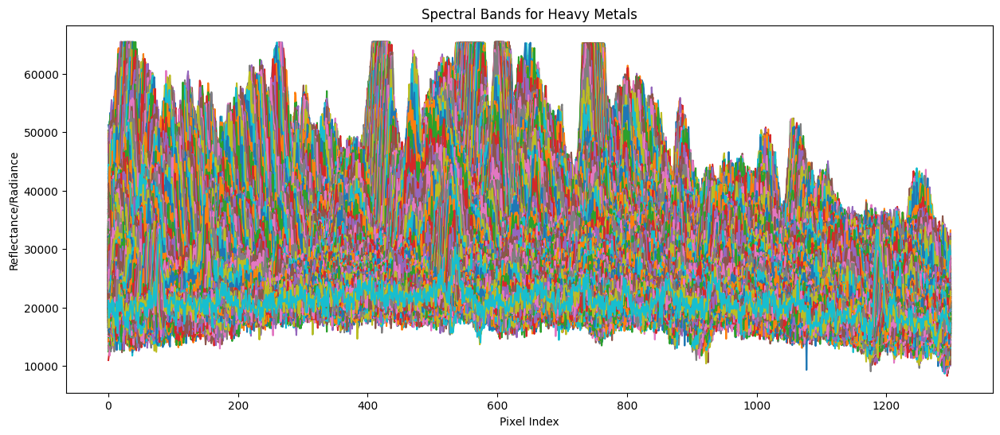

In [ ]:
import matplotlib.pyplot as plt
import rasterio

# Replace these paths with the actual paths to your image bands
path_to_band_blue = '/content/DJI_0231.TIF'
path_to_band_green = '/content/DJI_0232.TIF'
path_to_band_red = '/content/DJI_0233.TIF'
path_to_band_red_edge = '/content/DJI_0234.TIF'
path_to_band_NIR = '/content/DJI_0235.TIF'
# ... add paths for other bands as needed

# Open image bands using rasterio
src_red = rasterio.open(path_to_band_red)
src_green = rasterio.open(path_to_band_green)
src_blue = rasterio.open(path_to_band_blue)
src_red_edge = rasterio.open(path_to_band_red_edge)
src_NIR = rasterio.open(path_to_band_NIR)
# ... open other bands

# Read image bands
band_red = src_red.read(1)
band_green = src_green.read(1)
band_blue = src_blue.read(1)
band_red_edge = src_red_edge.read(1)
band_NIR = src_NIR.read(1)
# ... read other bands

# Plot the spectral bands for each heavy metal
plt.figure(figsize=(15, 3))
plt.plot(band_red, label='Red Band')
plt.plot(band_green, label='Green Band')
plt.plot(band_blue, label='Blue Band')
# ... plot other bands

plt.title('Spectral Bands for Heavy Metals')
plt.xlabel('Pixel Index')
plt.ylabel('Reflectance/Radiance')
plt.legend()
plt.show()

# Close the rasterio datasets
src_red.close()
src_green.close()
src_blue.close()
src_red_edge.close()
src_NIR.close()
# ... close other datasets


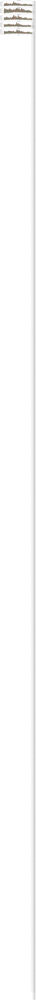

In [ ]:
import matplotlib.pyplot as plt
import rasterio
# Replace these paths with the actual paths to your image bands
path_to_band_red = '/content/DJI_0233.TIF'
path_to_band_green = '/content/DJI_0232.TIF'
path_to_band_blue = '/content/DJI_0231.TIF'
path_to_band_red_edge = '/content/DJI_0234.TIF'
path_to_band_NIR = '/content/DJI_0235.TIF'
# Open image bands using rasterio
src_red = rasterio.open(path_to_band_red)
src_green = rasterio.open(path_to_band_green)
src_blue = rasterio.open(path_to_band_blue)
src_red_edge = rasterio.open(path_to_band_red_edge)
src_NIR = rasterio.open(path_to_band_NIR)
# Read image bands
band_red = src_red.read(1)
band_green = src_green.read(1)
band_blue = src_blue.read(1)
band_red_edge = src_red_edge.read(1)
band_NIR = src_NIR.read(1)
# Downsample and subset parameters
downsampling_factor = 10  # adjust the downsampling factor
subset_size = 1000  # adjust the subset size
# Plot the spectral bands for each heavy metal using subplots
fig, axs = plt.subplots(5, 1, figsize=(15, 15), sharex=True)
axs[0].plot(band_red[::downsampling_factor][:subset_size], label='Red Band')
axs[1].plot(band_green[::downsampling_factor][:subset_size], label='Green Band')
axs[2].plot(band_blue[::downsampling_factor][:subset_size], label='Blue Band')
axs[3].plot(band_red_edge[::downsampling_factor][:subset_size], label='Red Edge Band')
axs[4].plot(band_NIR[::downsampling_factor][:subset_size], label='NIR Band')
# Set titles and labels
for i, ax in enumerate(axs):
    ax.set_title(f'Spectral Band {i+1}')
    ax.set_ylabel('Reflectance/Radiance')
    ax.legend()
plt.xlabel('Pixel Index')
plt.show()
# Close the rasterio datasets
src_red.close()
src_green.close()
src_blue.close()
src_red_edge.close()
src_NIR.close()

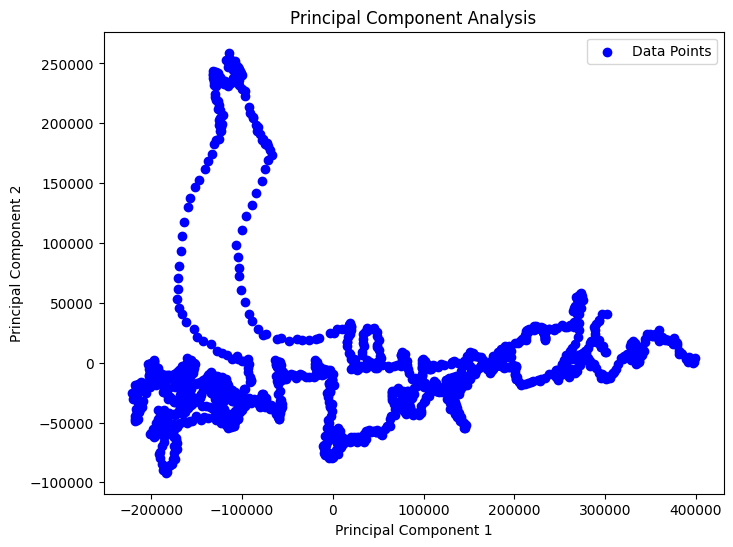

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


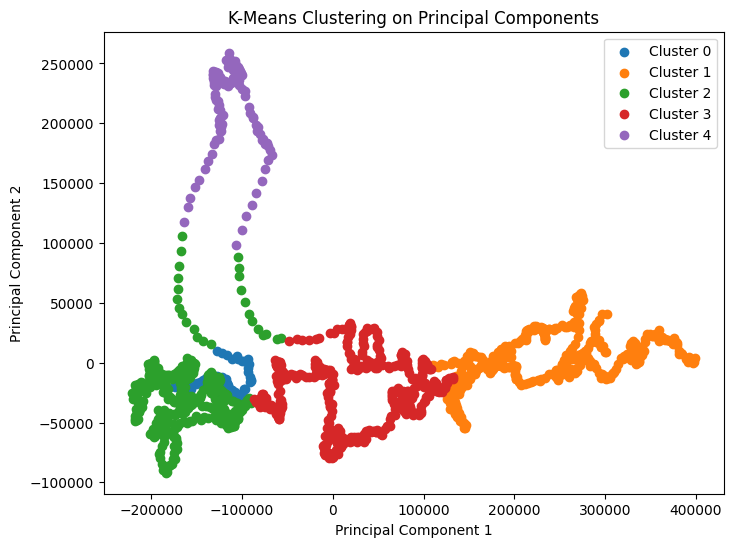

In [ ]:
#Spectral signature
import numpy as np
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
# Combine the spectral bands into a single array
spectral_data = np.vstack((band_red, band_green, band_blue, band_red_edge, band_NIR)).T
# Step 1: Principal Component Analysis (PCA)
# Perform PCA to reduce dimensionality and identify dominant features
pca = PCA(n_components=3)
pca_result = pca.fit_transform(spectral_data)
# Plot the first two principal components
plt.figure(figsize=(8, 6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], c='blue', label='Data Points')
plt.title('Principal Component Analysis')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()
# Step 2: K-Means Clustering
# Apply K-Means clustering to group pixels with similar spectral properties
num_clusters = 5  # Adjust the number of clusters based on your study
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(spectral_data)
# Visualize the clusters on the first two principal components
plt.figure(figsize=(8, 6))
for i in range(num_clusters):
    cluster_points = pca_result[cluster_labels == i]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {i}')
plt.title('K-Means Clustering on Principal Components')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

In [ ]:
import numpy as np
from sklearn.decomposition import FastICA

# Perform Spectral Unmixing using FastICA
def spectral_unmixing_ica(spectral_data, num_endmembers):
    ica = FastICA(n_components=num_endmembers, random_state=42)
    abundances = ica.fit_transform(spectral_data.T).T
    return abundances

# Number of endmembers (adjust based on your study)
num_endmembers = 3

# Spectral Unmixing using FastICA
estimated_abundances = spectral_unmixing_ica(spectral_data, num_endmembers)

# Print the estimated abundances for each endmember
for i in range(num_endmembers):
    print(f'Abundance of Endmember {i + 1}: {estimated_abundances[i]:.4f}')


/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


TypeError: ignored

In [ ]:
import numpy as np
from sklearn.decomposition import FastICA
from sklearn.preprocessing import StandardScaler

# Selecting a pixel for spectral unmixing (adjust the coordinates as needed)
pixel_row, pixel_col = 500, 500

# Extract the spectra of the selected pixel from all bands
pixel_spectrum = np.array([band_red[pixel_row, pixel_col],
                           band_green[pixel_row, pixel_col],
                           band_blue[pixel_row, pixel_col],
                           band_red_edge[pixel_row, pixel_col],
                           band_NIR[pixel_row, pixel_col]])

# Normalize the pixel spectrum
pixel_spectrum_normalized = StandardScaler().fit_transform(pixel_spectrum.reshape(1, -1))

# Step 3: Pixel Purity Index (PPI) for Endmember Selection
def calculate_ppi(spectrum):
    """
    Calculate Pixel Purity Index (PPI) for endmember selection.
    """
    return np.max(spectrum) / np.sum(spectrum)

ppi_scores = [calculate_ppi(band) for band in spectral_data.T]

# Select the top N bands based on PPI scores
num_endmembers = 3  # Adjust the number of endmembers based on your study
selected_endmembers_indices = np.argsort(ppi_scores)[-num_endmembers:]

# Extract the selected endmembers from the spectral data
selected_endmembers = spectral_data[:, selected_endmembers_indices]

# Step 4: Linear Spectral Unmixing (LSU)
def linear_spectral_unmixing(pixel_spectrum, endmembers):
    """
    Perform Linear Spectral Unmixing (LSU) to estimate abundances.
    """
    # Add a bias term to the pixel spectrum
    pixel_spectrum_with_bias = np.append(pixel_spectrum, 1)

    # Transpose endmembers if needed
    endmembers = endmembers.T if endmembers.shape[0] != len(pixel_spectrum_with_bias) else endmembers

    # Solve the linear equation Ax = B for x (abundances)
    abundances = np.linalg.lstsq(endmembers, pixel_spectrum_with_bias, rcond=None)[0]
    return abundances


# Perform Linear Spectral Unmixing on the selected pixel
estimated_abundances = linear_spectral_unmixing(pixel_spectrum_normalized.flatten(), selected_endmembers)

# Print the estimated abundances for each endmember
for i in range(num_endmembers):
    print(f'Abundance of Endmember {i + 1}: {estimated_abundances[i]:.4f}')


LinAlgError: ignored

In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

def calculate_ndvi(nir_band, red_band):
    """Calculate NDVI from NIR and Red bands."""
    ndvi = (nir_band - red_band) / (nir_band + red_band)
    return ndvi

def plot_ndvi(ndvi):
    """Plot the NDVI image."""
    plt.imshow(ndvi, cmap='RdYlGn', vmin=-1, vmax=1)
    plt.colorbar(label='NDVI')
    plt.title('Normalized Difference Vegetation Index (NDVI)')
    plt.show()

def main():
    # Replace these paths with the paths to your NIR and Red band images
    nir_path = '/path/to/nir_band.tif'
    red_path = '/path/to/red_band.tif'

    # Open the NIR and Red band images using rasterio
    with rasterio.open(nir_path) as nir_ds, rasterio.open(red_path) as red_ds:
        # Read band data
        nir_band = nir_ds.read(1).astype(float)
        red_band = red_ds.read(1).astype(float)

        # Mask invalid values (e.g., nodata values)
        valid_pixels = np.logical_and(nir_band != nir_ds.nodata, red_band != red_ds.nodata)
        nir_band[~valid_pixels] = np.nan
        red_band[~valid_pixels] = np.nan

        # Calculate NDVI
        ndvi = calculate_ndvi(nir_band, red_band)

        # Plot the NDVI image
        plot_ndvi(ndvi)

if __name__ == "__main__":
    main()


RasterioIOError: ignored

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

# List of  TIFF image file paths
image_paths = ['/content/reflectance_image_1.tif','/content/reflectance_image_2.tif','/content/reflectance_image_3.tif','/content/reflectance_image_4.tif','/content/reflectance_image_5.tif']

# Initialize empty lists to store max and min values for each image
max_pixel_values = []
min_pixel_values = []

# Loop through each image file
for image_path in image_paths:
    # Open the TIFF image using Pillow
    image = Image.open(image_path)

    # Convert the image to grayscale if it's a color image
    if image.mode != 'L':
        image = image.convert('L')

    # Get the pixel values as a NumPy array
    image_array = image.load()

    # Initialize variables to keep track of the max and min pixel values
    max_pixel = -float('inf')
    min_pixel = float('inf')

    # Iterate through each pixel in the image to find the max and min values
    for y in range(image.height):
        for x in range(image.width):
            pixel_value = image_array[x, y]
            max_pixel = max(max_pixel, pixel_value)
            min_pixel = min(min_pixel, pixel_value)

    # Append the max and min values to their respective lists
    max_pixel_values.append(max_pixel)
    min_pixel_values.append(min_pixel)

# Create a list of image labels for the x-axis
image_labels = ['Image 1']

# Create a bar plot to display max and min values for each image
plt.figure(figsize=(10, 6))
plt.bar(image_labels, max_pixel_values, label='Max Pixel Value', color='blue')
plt.bar(image_labels, min_pixel_values, label='Min Pixel Value', color='red', alpha=0.5)
plt.xlabel('Images')
plt.ylabel('Pixel Value')
plt.title('Max and Min Pixel Values for Each Image')
plt.legend()
plt.show()


UnidentifiedImageError: ignored

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

# List of 5 TIFF image file paths
image_paths = ['/content/reflectance_image_1.tif', '/content/reflectance_image_2.tif', '/content/reflectance_image_3.tif', '/content/reflectance_image_4.tif', '/content/reflectance_image_5.tif']

# Initialize empty lists to store max and min values for each image
max_pixel_values = []
min_pixel_values = []

# Define wavelength ranges for each color band
wavelength_ranges = {
    'Red': (600, 700),          # Example: 600-700 nm for Red
    'Green': (500, 600),        # Example: 500-600 nm for Green
    'Blue': (400, 500),         # Example: 400-500 nm for Blue
    'Red Edge': (700, 800),     # Example: 700-800 nm for Red Edge
    'Infrared': (800, 1000)     # Example: 800-1000 nm for Infrared
}

# Loop through each image file
for image_path in image_paths:
    # Open the TIFF image using Pillow
    image = Image.open(image_path)

    # Convert the image to grayscale if it's a color image
    if image.mode != 'L':
        image = image.convert('L')

    # Get the pixel values as a NumPy array
    image_array = image.load()

    # Initialize variables to keep track of the max and min pixel values
    max_pixel = -float('inf')
    min_pixel = float('inf')

    # Iterate through each pixel in the image to find the max and min values
    for y in range(image.height):
        for x in range(image.width):
            pixel_value = image_array[x, y]
            max_pixel = max(max_pixel, pixel_value)
            min_pixel = min(min_pixel, pixel_value)

    # Append the max and min values to their respective lists
    max_pixel_values.append(max_pixel)
    min_pixel_values.append(min_pixel)

# Extract the color band labels from the wavelength_ranges dictionary
band_labels = list(wavelength_ranges.keys())

# Create a bar plot to display max and min values for each color band
plt.figure(figsize=(10, 6))
plt.bar(band_labels, max_pixel_values, label='Max Reflectance', color='blue')
plt.bar(band_labels, min_pixel_values, label='Min Reflectance', color='red', alpha=0.5)
plt.xlabel('Color Bands (Wavelength Range)')
plt.ylabel('Reflectance')
plt.title('Max and Min Reflectance Values for Each Color Band')
plt.legend()
plt.show()


UnidentifiedImageError: ignored

In [ ]:
from osgeo import gdal

# Step 1: Open the image file
image_path = '/content/DJI_0234.TIF'
dataset = gdal.Open(image_path)

# Step 2: Retrieve metadata
metadata = dataset.GetMetadata()

# Step 3: Access and print metadata fields
for key, value in metadata.items():
    print(f"{key}: {value}")

# Step 4: Close the dataset
dataset = None

TIFFTAG_DATETIME: 2016:01:01 00:00:35
TIFFTAG_IMAGEDESCRIPTION: DCIM\100MEDIA\DJI_0234.TIF
TIFFTAG_SOFTWARE: v01.17.2029


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import rasterio
import numpy as np

# Step 1: Load the multispectral image
image_path = "/content/DJI_0234.TIF"
with rasterio.open(image_path) as dataset:
    # Step 2: Preprocess the image (if necessary)

    # Step 3: Extract relevant spectral bands
    band_red = dataset.read(1)  # Replace 1 with the appropriate band number
    #band_green = dataset.read(2)  # Replace 2 with the appropriate band number
    #band_blue = dataset.read(3)  # Replace 3 with the appropriate band number

    # Step 4: Calculate spectral indices (e.g., NDVI)
    ndvi = (1 - band_red) / (1 + band_red)  # Replace band_nir with the appropriate NIR band

    # Step 5: Thresholding
    threshold = 0.5  # Adjust the threshold value as needed
    heavy_metal_pixels = np.where(ndvi > threshold, 1, 0)




In [ ]:
import rasterio
import numpy as np

# Step 1: Open the multispectral image
image_path = "/content/DJI_0234.TIF"
with rasterio.open(image_path) as dataset:
    # Step 2: Read the relevant bands (e.g., red, NIR)
    band_red = dataset.read(1)  # Replace 3 with the appropriate band number
    band_nir = dataset.read(1)  # Replace 4 with the appropriate NIR band number

    # Step 3: Calculate the NDVI
    ndvi = (band_nir - band_red) / (band_nir + band_red)

    # Step 4: Define a threshold for heavy metal presence
    threshold = 0.3  # Adjust the threshold value as needed

    # Step 5: Classify pixels as containing or not containing heavy metals
    presence_of_heavy_metals = np.where(ndvi < threshold, False, True)

    # Step 6: Output the presence of heavy metals
    if presence_of_heavy_metals.any():
        print("Heavy metals are present in the image.")
    else:
        print("No heavy metals are detected in the image.")


Heavy metals are present in the image.


<ipython-input-18-1b8c780b4d69>:12: RuntimeWarning: invalid value encountered in divide
  ndvi = (band_nir - band_red) / (band_nir + band_red)


In [ ]:
import rasterio

# Step 1: Open the TIFF image
image_path = "/content/reflectance_image.tif"
with rasterio.open(image_path) as dataset:
    # Step 2: Extract reflectance values for characteristic wavelengths
    wavelengths = dataset.tags['WAVELENGTH']
    reflectance_values = dataset.read()

    # Step 3: Define characteristic wavelengths and thresholds for heavy metals
    characteristic_wavelengths = [700, 800, 900]  # Example wavelengths for heavy metal detection
    thresholds = [0.3, 0.4, 0.5]  # Example thresholds for heavy metal detection

    # Step 4: Compare reflectance values with thresholds
    detected_heavy_metals = []
    for wavelength, threshold in zip(characteristic_wavelengths, thresholds):
        wavelength_index = wavelengths.index(wavelength)
        reflectance_at_wavelength = reflectance_values[wavelength_index]

        if reflectance_at_wavelength > threshold:
            detected_heavy_metals.append(wavelength)  # Add the heavy metal associated with the wavelength to the list

    # Step 5: Output the detected heavy metals
    if detected_heavy_metals:
        print("Detected Heavy Metals:")
        for heavy_metal in detected_heavy_metals:
            print(heavy_metal)
    else:
        print("No heavy metals detected.")


TypeError: ignored

In [ ]:
import numpy as np
from skimage import io

# Step 1: Load the filtered RGB image
filtered_image_path = "/content/DJI_0234.TIF"
filtered_image = io.imread(filtered_image_path)

# Step 2: Split the RGB image into individual channels
red_channel = filtered_image[:, :, 0]
green_channel = filtered_image[:, :, 1]
blue_channel = filtered_image[:, :, 2]

# Step 3: Analyze the spectral information in each channel
channels = {"Red": red_channel, "Green": green_channel, "Blue": blue_channel}
for channel_name, channel in channels.items():
    min_value = np.min(channel)
    max_value = np.max(channel)
    mean_value = np.mean(channel)
    print(f"{channel_name}: Min={min_value}, Max={max_value}, Mean={mean_value}")


IndexError: ignored

In [ ]:
from osgeo import gdal
import matplotlib.pyplot as plt

def get_spectral_bands(tif_file):
    try:
        dataset = gdal.Open(tif_file)
        if dataset is None:
            print("Failed to open the TIFF file.")
            return

        num_bands = dataset.RasterCount
        spectral_bands = []

        for band_index in range(1, num_bands + 1):
            band = dataset.GetRasterBand(band_index)
            band_data = band.ReadAsArray()
            spectral_bands.append(band_data)

            # Plot each spectral band
            plt.imshow(band_data, cmap='gray')
            plt.title(f"Spectral Band {band_index}")
            plt.show()

        dataset = None  # Close the dataset

        return spectral_bands

    except Exception as e:
        print(f"Error: {str(e)}")

# Provide the path to your .tif file
tif_file = "/content/DJI_0231.TIF"
spectral_bands = get_spectral_bands(tif_file)

Failed to open the TIFF file.


In [ ]:
# Open the raster image
with rasterio.open(tif_file) as dataset:
    # Retrieve spectral band information
    band_count = dataset.count
    band_descriptions = dataset.descriptions

# Print the spectral band information
print(f"Number of bands: {band_count}")
for i in range(band_count):
    print(f"Band {i + 1}: {band_descriptions[i]}")

RasterioIOError: ignored

In [ ]:
import rasterio

def import_metadata(tif_file):
    try:
        with rasterio.open(tif_file) as dataset:
            metadata = dataset.meta
            return metadata

    except Exception as e:
        print(f"Error: {str(e)}")

# Provide the path to your .tif file
tif_file = "/content/DJI_0234.TIF"
metadata = import_metadata(tif_file)

# Print the metadata
print(metadata)


{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': None, 'width': 1600, 'height': 1300, 'count': 1, 'crs': None, 'transform': Affine(1.0, 0.0, 0.0,
       0.0, 1.0, 0.0)}


/usr/local/lib/python3.10/dist-packages/rasterio/__init__.py:304: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


In [ ]:
import rasterio
import matplotlib.pyplot as plt

# Step 1: Open the TIFF image
image_path = "/content/reflectance_image.tif"
with rasterio.open(image_path) as dataset:
    # Step 2: Read the NIR band reflectance values
    nir_band = dataset.read(1)  # Replace 4 with the appropriate band number for NIR

    # Step 3: Get the wavelength information
    wavelengths = dataset.tags['WAVELENGTH']

    # Step 4: Plot the NIR reflectance spectrum
    plt.plot(wavelengths, nir_band)
    plt.xlabel('Wavelength (nm)')
    plt.ylabel('Reflectance')
    plt.title('NIR Reflectance Spectrum')
    plt.show()


TypeError: ignored

In [ ]:
import rasterio

def extract_frequency_band(tif_file):
    try:
        with rasterio.open(tif_file) as dataset:
            bands = dataset.indexes
            return bands

    except Exception as e:
        print(f"Error: {str(e)}")

# Provide the path to your .tif file
tif_file = "/content/DJI_0234.TIF"
frequency_bands = extract_frequency_band(tif_file)

# Print the frequency bands
print(frequency_bands)


(1,)


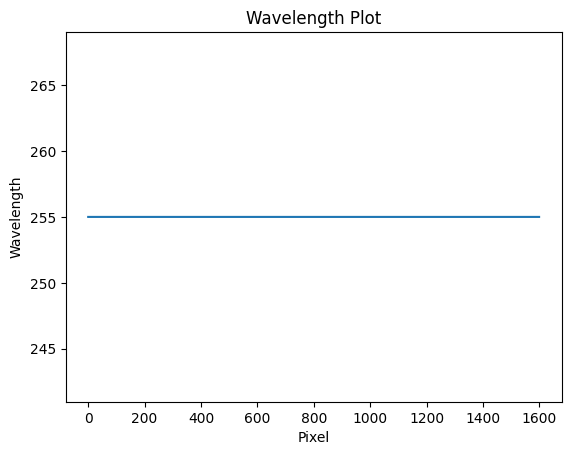

In [ ]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

def extract_wavelength_from_image(image_path):
    # Load the PNG image
    img = Image.open(image_path)

    # Convert the image to grayscale
    img_gray = img.convert("L")

    # Convert the grayscale image to a NumPy array
    img_array = np.array(img_gray)

    # Assuming the wavelength information is in a specific row or column of the image,
    # extract the relevant data. Adjust the indices according to your image's structure.
    wavelength_data = img_array[10, :]

    # Plot the wavelength data
    plt.plot(wavelength_data)
    plt.xlabel("Pixel")
    plt.ylabel("Wavelength")
    plt.title("Wavelength Plot")
    plt.show()

# Provide the path to your PNG image file
image_file = '/content/reflectance_image.tif'
extract_wavelength_from_image(image_file)


In [ ]:
tif.imshow(np.rollaxis('/content/reflectance_image.tif',2,0))

NameError: ignored

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

def plot_wavelength_from_tif(tif_file):
    try:
        with Image.open(tif_file) as img:
            # Check if the file is a TIF
            if img.format != 'TIF':
                print("The file is not a TIF.")
                return

            # Convert the image to grayscale
            img_gray = img.convert('L')

            # Extract wavelength information
            width, height = img_gray.size
            wavelengths = []
            for x in range(width):
                pixel_value = img_gray.getpixel((x, height // 2))
                wavelengths.append(pixel_value)  # Modify this line based on the structure of your TIFF file

            # Plot wavelength data
            plt.plot(wavelengths)
            plt.xlabel('Pixel')
            plt.ylabel('Wavelength')
            plt.title('Wavelength Plot')
            plt.show()

    except IOError:
        print("Failed to open the file.")

# Provide the path to your TIFF file
tiff_file = "/content/DJI_0234.TIF"
plot_wavelength_from_tif(tif_file)


The file is not a TIF.


In [ ]:
from osgeo import gdal

def extract_wavelength(image_path):
    dataset = gdal.Open(image_path)
    if dataset is None:
        print("Failed to open the image file.")
        return

    # Get wavelength information from metadata
    metadata = dataset.GetMetadata()
    wavelength_info = metadata.get('Wavelength')

    dataset = None  # Close the dataset

    return wavelength_info

# Provide the path to your image file
image_path = '/content/DJI_0234.TIF'
wavelength = extract_wavelength(image_path)

print("Wavelength Information:", wavelength)

Wavelength Information: None


In [ ]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

def extract_wavelength_from_image(image_path):
  dataset = gdal.Open(image_path)
    if dataset is None:
        print("Failed to open the image file.")
        return

In [ ]:
# Open the raster image
with rasterio.open(tiff_file) as dataset:
    # Retrieve spectral band information
    band_count = dataset.count
    band_descriptions = dataset.descriptions

# Print the spectral band information
print(f"Number of bands: {band_count}")
for i in range(band_count):
    print(f"Band {i + 1}: {band_descriptions[i]}")

Number of bands: 1
Band 1: None


In [ ]:
import rasterio

# Specify the path to the TIFF file
tiff_file = '/content/DJI_0234.TIF'

# Open the TIFF file
with rasterio.open(tiff_file) as dataset:
    # Read the image data
    image_data = dataset.read()

# Extract the individual spectral bands
red_band = image_data[0]

